# Identifying white water on the coast

**What does this notebook do?** 

This notebook demonstrates how to identify white water on the coast by computing an index based on reflectance in near-infrared and short wave infrared bands.

**Requirements:**

You need to run the following commands from the command line prior to launching jupyter notebooks from the same terminal so that the required libraries and paths are set:

`module use /g/data/v10/public/modules/modulefiles` 

`module load dea` 

This notebook uses external functions called `DEAPlotting.rgb` and `DEADataHandling.load_clearlandsat`. These functions are available in the `10_Scripts` folder of the [dea-notebooks Github repository](https://github.com/GeoscienceAustralia/dea-notebooks/tree/master/10_Scripts). Note that these functions have been developed by DEA users, not the DEA development team, and so are provided without warranty. If you find an error or bug in the functions, please either create an 'Issue' in the Github repository, or fix it yourself and create a 'Pull' request to contribute the updated function back into the repository (See the repository [README](https://github.com/GeoscienceAustralia/dea-notebooks/blob/master/README.rst) for instructions on creating a Pull request).

**Date:** March 2019

**Author:** Robbi Bishop-Taylor, Leo Lymburner

## Load modules

In [1]:
# Import modules
import os
import sys
import datacube 

# Import external dea-notebooks functions using relative link to Scripts directory
sys.path.append('../10_Scripts')
import DEAPlotting, DEADataHandling

# Set up datacube instance
dc = datacube.Datacube(app='White Water index')


## Load in Landsat data
Here we use `DEADataHandling.load_clearlandsat` to import cloud-free Landsat data from the datacube

In [2]:
query = {'lat': (-28.628931, -28.668931),   
         'lon': (153.599037, 153.639037),
         'time': ('2016-10-07', '2018-03-31')}
         
minimum_cloudfree_perc = 0.9

landsat_ds = DEADataHandling.load_clearlandsat(dc=dc, query=query,
                                               bands_of_interest=['red', 'green', 'blue', 'nir', 'swir1'] ,     
                                               masked_prop=minimum_cloudfree_perc, 
                                               mask_pixel_quality=True,
                                               mask_invalid_data=True)

Loading ls5
    Skipping ls5; no valid data for query
Loading ls7
    Ignoring SLC-off observations for ls7
    Skipping ls7; no valid data for query
Loading ls8
    Loading 32 filtered ls8 timesteps
Returning ls8 data
    Replacing invalid -999 values with NaN (data will be coerced to float64)


### Plot time series of imagery

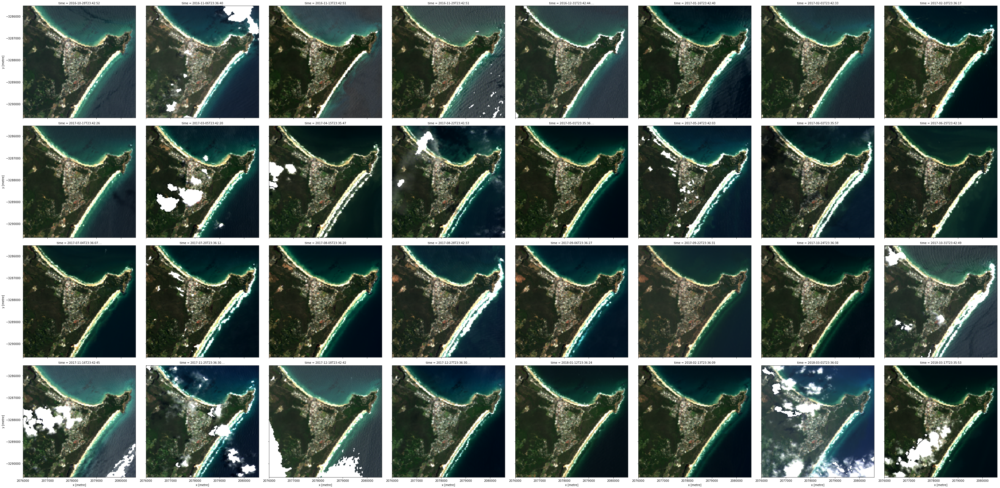

In [3]:
DEAPlotting.rgb(landsat_ds, col='time', col_wrap = 8)

## Compute index to identify white water using ratio of near infrared to shortwave radiation

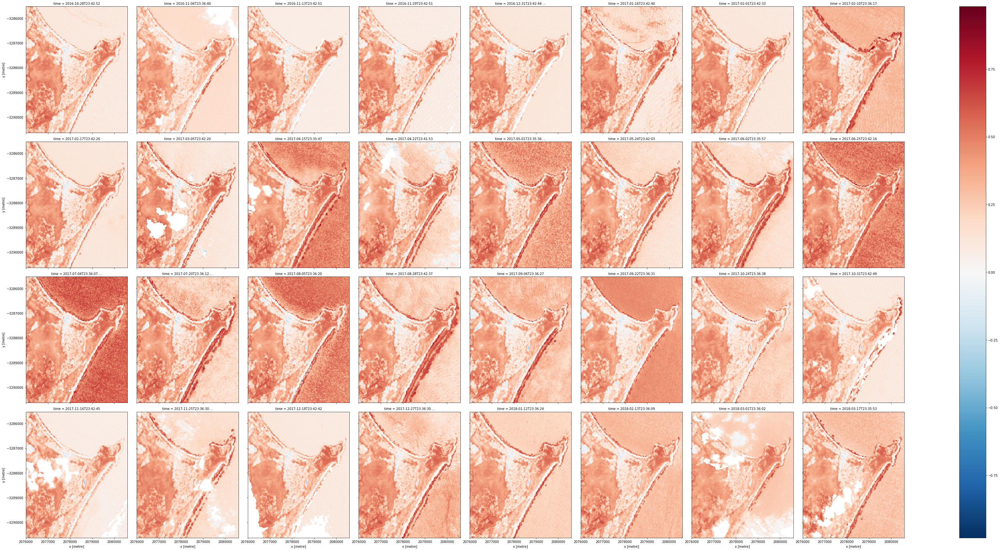

In [4]:
ndwwi = (landsat_ds.nir - landsat_ds.swir1) / (landsat_ds.nir + landsat_ds.swir1)
ndwwi.plot(col='time', size=6, aspect=1, col_wrap = 8)

## Mask out land
As this index is intended for use over water, we can use the Modified Normalised Difference Water Index to mask out land pixels

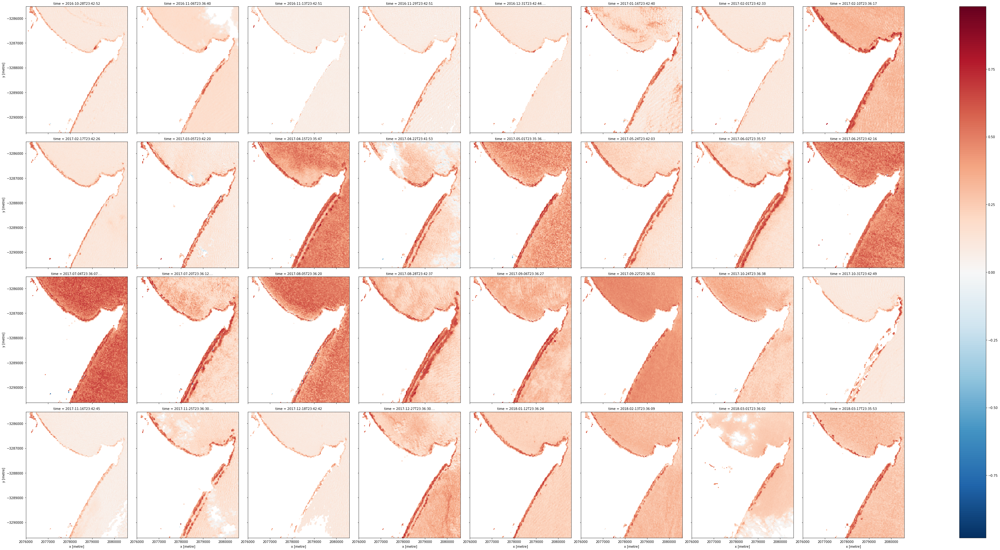

In [5]:
mndwi = (landsat_ds.green - landsat_ds.swir1) / (landsat_ds.green + landsat_ds.swir1)
ndwwi.where(mndwi > 0).plot(col='time', col_wrap=8, size=6, aspect=1)